<a href="https://colab.research.google.com/github/tsengpokai/-10--/blob/main/PyGMT_U11310015.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### PyGMT 0.17 no Google Colab

> ⚠️ **Nota:** Há uma incompatibilidade temporária no sistema de resolução do conda/mamba no Colab (a versão do Python em uso é **3.12.11**, mas o solver pode conter um *pin* interno diferente).  
> Por isso, para instalar o PyGMT é necessário usar uma versão compatível do **condacolab** (ou ajustar o arquivo `pinned` do conda para **python=3.12**).  
> Depois disso, o **PyGMT 0.17** instala e executa normalmente. Isso será corrigido em uma atualização futura do Colab.


In [1]:
!pip install condacolab --quiet
# need to install condacolab for a python 3.11 pin
import condacolab
condacolab.install_from_url("https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh")

✨🍰✨ Everything looks OK!


**Don't PANIC !** The kernel will restart automatically.

After that, install `pygmt` normally.

In [2]:
!mamba install pygmt --quiet # <--- it takes around 1 minute

In [3]:
import pygmt
pygmt.show_versions()

PyGMT information:
  version: v0.17.0
System information:
  python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
  executable: /usr/bin/python3.real.real
  machine: Linux-6.6.105+-x86_64-with-glibc2.35
Dependency information:
  numpy: 2.3.4
  pandas: 2.3.3
  xarray: 2025.10.1
  packaging: 25.0
  contextily: None
  geopandas: 1.1.1
  IPython: 7.34.0
  pyarrow: 18.1.0
  rioxarray: None
  gdal: 3.11.0
  ghostscript: 10.06.0
GMT library information:
  version: 6.5.0
  padding: 2
  share dir: /usr/local/share/gmt
  plugin dir: /usr/local/lib/gmt/plugins
  library path: /usr/local/lib/libgmt.so
  cores: 2
  grid layout: rows
  image layout: 
  binary version: 6.5.0


gmtread [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
gmtread [NOTICE]: SRTM15 Earth Relief v2.7 at 1x1 arc degrees reduced by Gaussian Cartesian filtering (314.5 km fullwidth) [Tozer et al., 2019].
gmtread [NOTICE]:   -> Download grid file [111K]: earth_relief_01d_p.grd


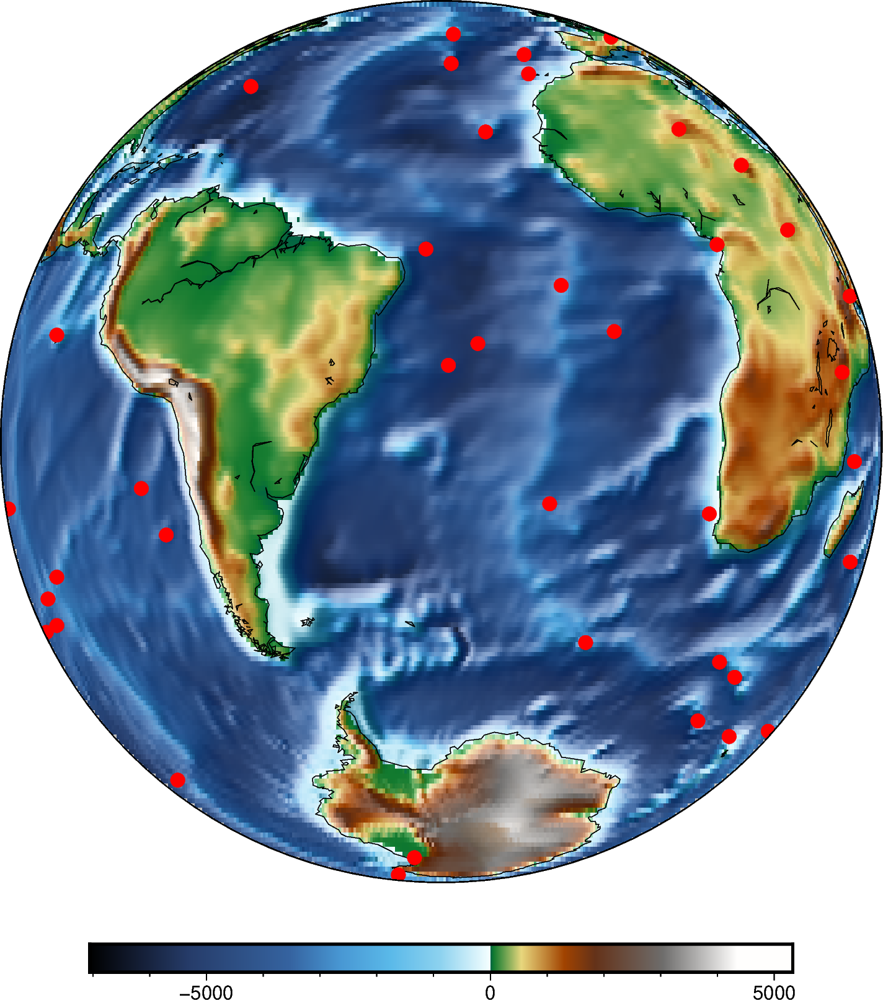

In [4]:
# Just an example
from pygmt.datasets import load_earth_relief #<-- Use global relief for topography

grid = load_earth_relief(resolution='01d', registration='pixel')

fig = pygmt.Figure()
fig.basemap(region='g', projection='G330/-30/12c', frame=True)
fig.grdimage(grid, cmap='geo', shading=True)
fig.coast(resolution='c', shorelines=True, area_thresh=1000)
fig.plot(data='@hotspots.txt', style='c0.2c', fill='red')
fig.colorbar()
fig.show()

test 1

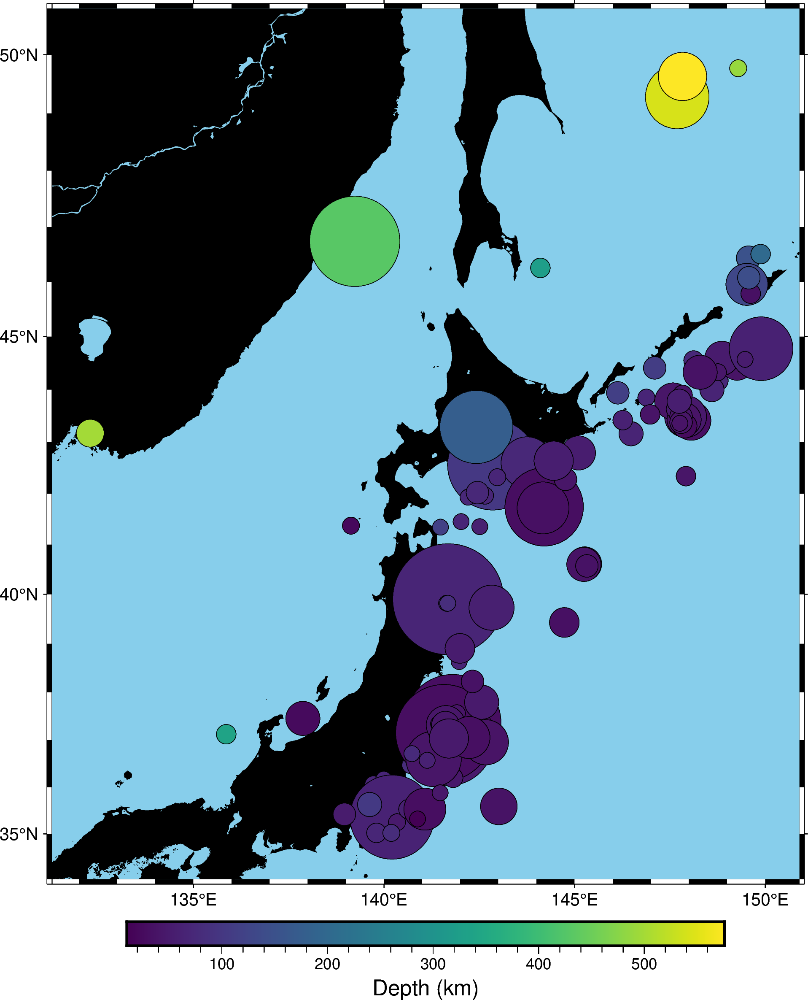

In [37]:
import pygmt
data = pygmt.datasets.load_sample_data(name="japan_quakes")
data.head()
region = [
    data.longitude.min() - 1,
    data.longitude.max() + 1,
    data.latitude.min() - 1,
    data.latitude.max() + 1,
]
region
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="black", water="skyblue")
pygmt.makecpt(cmap="viridis", series=[data.depth_km.min(), data.depth_km.max()])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    size=0.02 * 2**data.magnitude,
    fill=data.depth_km,
    cmap=True,
    style="cc",
    pen="black",
)
fig.colorbar(frame="xaf+lDepth (km)")
fig.show()

Test2


legend [WARNING]: Length <unit> o not supported - revert to default unit [cm]
legend [WARNING]: Volcan not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> w not supported - revert to default unit [cm]
legend [WARNING]: M not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> w not supported - revert to default unit [cm]
legend [WARNING]: M not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> w not supported - revert to default unit [cm]
legend [WARNING]: M not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> t not supported - revert to default unit [cm]
legend [WARNING]: Convergen not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> t not supported - revert to default unit [cm]
legend [WARNING]: Divergen not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> m not supported - revert to default unit [cm]
le

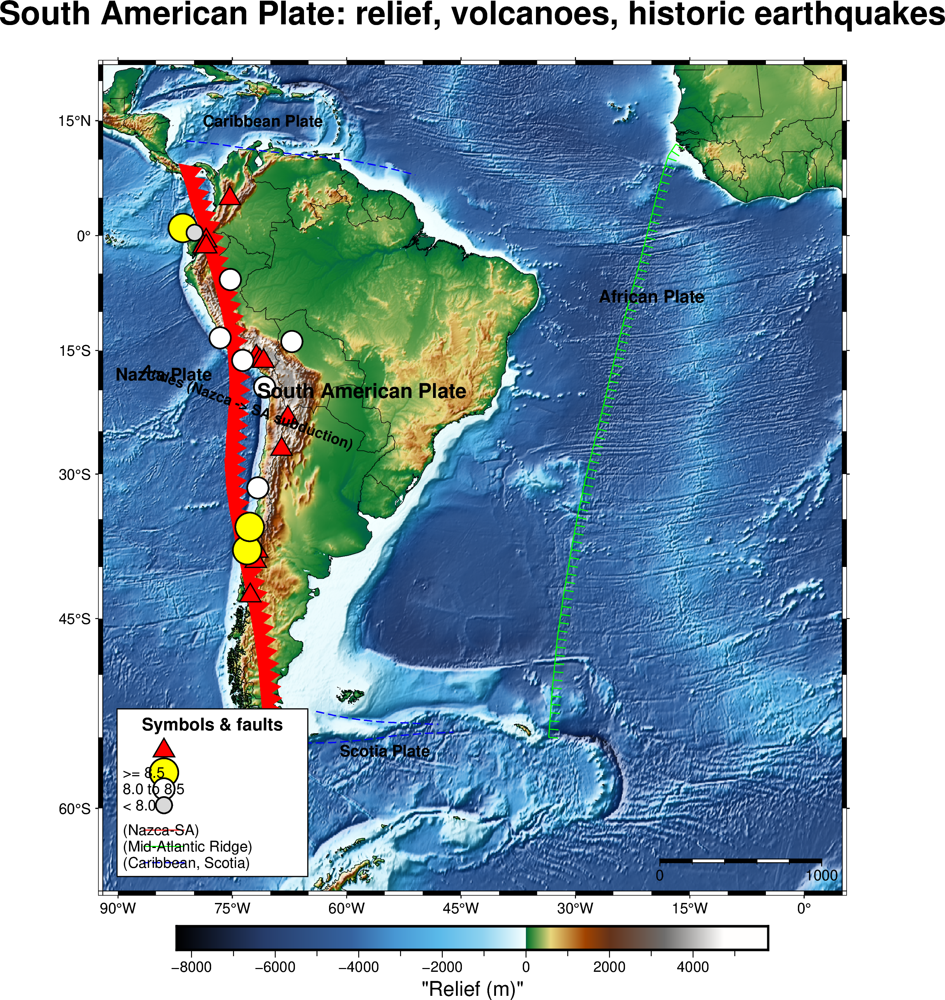

In [67]:
# --- South American Plate (fix subduction triangles, thin boundaries, tidy legend) ---
import io, numpy as np, pandas as pd, pygmt
from pygmt.datasets import load_earth_relief

region = [-92, 5, -65, 22]  # plate extent viewport

# relief
try:
    grid = load_earth_relief(resolution="05m", region=region)
except Exception:
    grid = load_earth_relief(resolution="10m", region=region)

fig = pygmt.Figure()
fig.grdimage(grid=grid, region=region, projection="M18c",
             cmap="geo", shading=True, frame=["WSen","af"])
fig.coast(shorelines="1/0.25p,black", borders="1/0.25p,black")
fig.colorbar(frame='af+l"Relief (m)"')

# ---------------- plate boundaries (draw first; thinner) ----------------
# Nazca–SA trench (N->S); triangles on LEFT side (+l) = toward continent
nazca_trench = np.array([
    [-81.5,  8.0],[-81.0,  6.5],[-80.6,  5.0],[-80.1,  3.5],[-79.6,  2.0],[-79.0,  0.5],
    [-78.6, -1.2],[-78.2, -3.2],[-77.6, -5.2],[-77.0, -7.4],[-76.4, -9.8],[-75.9,-12.2],
    [-75.6,-14.6],[-75.4,-17.0],[-75.3,-19.3],[-75.4,-21.8],[-75.6,-24.3],[-75.8,-26.8],
    [-75.9,-29.2],[-75.7,-31.6],[-75.3,-34.0],[-74.7,-36.6],[-74.1,-39.0],[-73.4,-41.5],
    [-72.7,-44.0],[-72.1,-46.4],[-71.6,-48.8],[-71.3,-51.0],[-71.0,-53.0]
])
# Caribbean transform（north margin）
caribbean_tf = np.array([
    [-81.0,12.4],[-79.0,12.2],[-77.0,12.0],[-75.0,11.7],[-73.0,11.4],[-71.0,11.1],
    [-69.0,10.9],[-67.0,10.7],[-65.0,10.5],[-63.0,10.3],[-61.0,10.1],[-59.0, 9.8],
    [-57.0, 9.4],[-55.0, 9.0],[-53.0, 8.5],[-51.0, 8.0]
])
# Mid-Atlantic Ridge（SA–Africa diverging）
atl_ridge = np.array([
    [-33.5,-55.0],[-33.0,-51.0],[-32.4,-47.0],[-31.6,-43.0],[-30.7,-39.0],
    [-29.8,-35.0],[-28.8,-31.0],[-27.7,-27.0],[-26.6,-23.0],[-25.6,-19.0],
    [-24.6,-15.0],[-23.6,-11.0],[-22.5, -7.0],[-21.4, -3.0],[-20.4,  1.0],
    [-19.4,  5.0],[-18.6,  8.0],[-17.8, 10.5],[-16.8, 12.0]
])
# Scotia transforms（Drake Passage & Scotia arc）
scotia_tf1 = np.array([[-72.0,-55.2],[-69.0,-55.3],[-66.0,-55.4],[-62.0,-55.4],[-58.0,-55.2],[-54.0,-54.9],[-50.0,-54.7],[-46.0,-54.6]])
scotia_tf2 = np.array([[-64.0,-53.0],[-60.0,-53.5],[-56.0,-53.8],[-52.0,-53.9],[-48.0,-54.0]])

def plot_front(poly, style, pen, fill):
    try:
        fig.plot(data=poly, style=style, pen=pen, fill=fill)
    except Exception:
        fig.plot(data=poly, pen=pen)

# thinner boundaries
plot_front(nazca_trench, style="f0.28c/0.55c+l+t", pen="0.6p,red",   fill="red")   # <-- +l triangles to SA
plot_front(atl_ridge,    style="f0.20c/0.45c+r",   pen="0.6p,green", fill="green") # ticks to Africa
fig.plot(data=caribbean_tf, pen="0.7p,blue,-")
fig.plot(data=scotia_tf1,  pen="0.7p,blue,-")
fig.plot(data=scotia_tf2,  pen="0.7p,blue,-")

# ---------------- volcanoes & historic earthquakes (draw last; bigger & bold) ----------------
volcano_csv = io.StringIO("""name,lon,lat
Nevado del Ruiz,-75.322,4.895
Cotopaxi,-78.436,-0.680
Chimborazo,-78.817,-1.469
Tungurahua,-78.443,-1.468
Sabancaya,-71.857,-15.787
Misti,-71.390,-16.290
Ubinas,-70.903,-16.355
Lascar,-67.730,-23.370
Ojos del Salado,-68.541,-27.109
Villarrica,-71.930,-39.420
Llaima,-71.730,-38.377
Chaiten,-72.646,-42.833
""")
volc = pd.read_csv(volcano_csv)
fig.plot(x=volc.lon, y=volc.lat, style="t0.60c", fill="red", pen="0.7p,black")

eq_csv = io.StringIO("""name,year,Mw,lon,lat
Valdivia,1960,9.5,-73.05,-38.29
Maule,2010,8.8,-72.72,-35.85
Ecuador-Colombia,1906,8.8,-81.50,1.00
Illapel,2015,8.3,-71.65,-31.57
Iquique,2014,8.2,-70.77,-19.61
Bolivia-deep,1994,8.2,-67.19,-13.85
Arequipa,2001,8.4,-73.64,-16.26
Pisco,2007,8.0,-76.60,-13.39
Pedernales,2016,7.8,-79.94,0.37
Peru-Ucayali,2019,8.0,-75.27,-5.80
""")
eq = pd.read_csv(eq_csv)
fig.plot(x=eq.loc[eq.Mw>=8.5,'lon'], y=eq.loc[eq.Mw>=8.5,'lat'],
         style="c0.70c", pen="1p,black", fill="yellow")
fig.plot(x=eq.loc[(eq.Mw>=8.0)&(eq.Mw<8.5),'lon'], y=eq.loc[(eq.Mw>=8.0)&(eq.Mw<8.5),'lat'],
         style="c0.52c", pen="1p,black", fill="white")
fig.plot(x=eq.loc[eq.Mw<8.0,'lon'], y=eq.loc[eq.Mw<8.0,'lat'],
         style="c0.40c", pen="1p,black", fill="gray85")

# ---------------- labels ----------------
for txt, x, y, fs in [
    ("South American Plate", -58, -20, 14),
    ("Nazca Plate",          -84, -18, 12),
    ("Caribbean Plate",      -71,  15, 11),
    ("African Plate",        -20,  -8, 12),
    ("Scotia Plate",         -55, -56, 11),
    ("Antarctic Plate",      -78, -60, 10),
]:
    fig.text(text=txt, x=x, y=y, font=f"{fs}p,Helvetica-Bold,0/0/0", justify="CM")
fig.text(text="Andes (Nazca -> SA subduction)", x=-73.0, y=-22,
         font="10p,Helvetica-Bold,0/0/0", angle=340, justify="CM")


legend_txt = """\
H 12p Symbols & faults
N 1
G 6p
S 1.0c t 0.60c red 0.7p Volcano
G 4p
S 1.0c c 0.70c yellow 1p,black Mw >= 8.5
S 1.0c c 0.52c white  1p,black Mw 8.0 to 8.5
S 1.0c c 0.40c gray85 1p,black Mw < 8.0
G 6p
S 1.0c - 1.0c - 0.6p,red   Convergent (Nazca-SA)
S 1.0c - 1.0c - 0.6p,green Divergent (Mid-Atlantic Ridge)
S 1.0c - 1.0c - 0.7p,blue,- Transform (Caribbean, Scotia)
"""

with open("legend_ascii.txt", "w", encoding="ascii") as f:
    f.write(legend_txt)

fig.legend(
    spec="legend_ascii.txt",
    position="JBL+jBL+o0.35c",   # 左下角，外移一點點
    box="+gwhite+p0.6p"          # 白底細框
)


# title & scale
fig.basemap(frame=['+tSouth American Plate: relief, volcanoes, historic earthquakes'])
fig.basemap(map_scale="jBR+w1000k+o0.5c/0.6c+f")

fig.show()


In [79]:
!mamba install wget

conda-forge/linux-64                                        Using cache
conda-forge/noarch                                          Using cache

Pinned packages:

  - python=3.12

Pinned packages:

  - python_abi[version="=3.12",build="*cp312*"]

Pinned packages:

  - cuda-version=12

Pinned packages:

  - python=3.12

Pinned packages:

  - python_abi[version="=3.12",build="*cp312*"]

Pinned packages:

  - cuda-version=12

Pinned packages:

  - python=3.12


Transaction

  Prefix: /usr/local

  Updating specs:

   - wget


  Package         Version  Build       Channel           Size
───────────────────────────────────────────────────────────────
  Install:
───────────────────────────────────────────────────────────────

  + libidn2         2.3.8  hfac485b_1  conda-forge      139kB
  + libunistring   0.9.10  h7f98852_0  conda-forge        1MB
  + wget           1.25.0  hc2d8bac_0  conda-forge      743kB

  Upgrade:
───────────────────────────────────────────────────────────────

  - op

步驟 1：正在定義區域與投影...
步驟 2：正在載入所有『最終修正版』的數據...
所有數據載入完畢。
步驟 3：正在繪製 '包含海底地形' 的地形圖...


plot [WARNING]:  not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> w not supported - revert to default unit [cm]
legend [WARNING]: M not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> w not supported - revert to default unit [cm]
legend [WARNING]: M not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> w not supported - revert to default unit [cm]
legend [WARNING]: M not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> o not supported - revert to default unit [cm]
legend [WARNING]: Volcan not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> d not supported - revert to default unit [cm]
legend [WARNING]: re not a valid number and may not be decoded properly.
legend [WARNING]: (Trench) not a valid number and may not be decoded properly.
legend [WARNING]: Length <unit> n not supported - revert to default unit [cm]
legend [WARNING]: 

步驟 4：正在繪製『真正貼合海岸線的海溝』+『適度鋸齒中洋脊』...
步驟 5：正在繪製 '顯眼的' 火山與地震...
步驟 6：正在添加標籤與圖例...
步驟 7：地圖生成完畢！


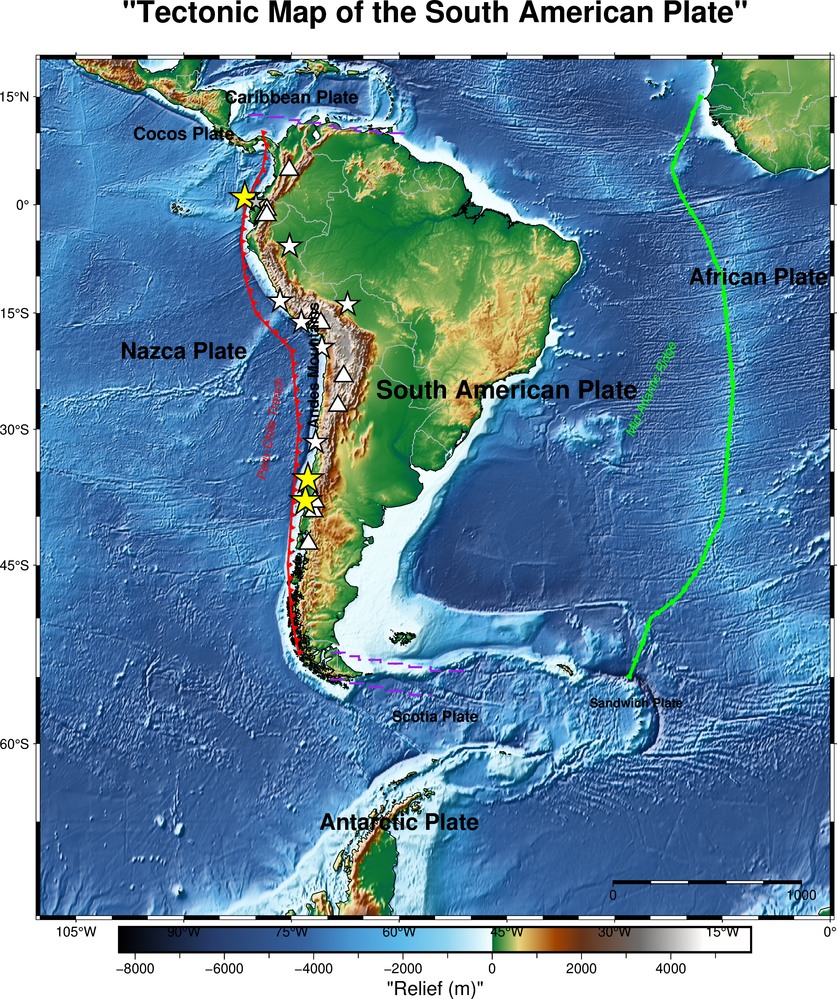

In [98]:

# -------------------------------------------------------------------
# 步驟 1：定義地圖區域與投影
# -------------------------------------------------------------------
print("步驟 1：正在定義區域與投影...")
region = [-110, 0, -70, 20]  # [lon_min, lon_max, lat_min, lat_max]
projection = "M22c"

pygmt.config(FONT_ANNOT_PRIMARY="12p") # 放大座標軸字體
pygmt.config(FONT_TITLE="20p,Helvetica-Bold") # 放大並加粗"總標題"

# -------------------------------------------------------------------
# 步驟 2：定義所有數據 (*** 最終修正：海溝貼合海岸線 ***)
# -------------------------------------------------------------------
print("步驟 2：正在載入所有『最終修正版』的數據...")

# ---【**全新重繪：真正貼合南美海岸線並『平移』的海溝**】---
# 1. 納茲卡海溝 (聚合型) - 紅色三角形
#    這組座標 "真正" 貼合海岸線，並向西平移約 0.5-1.0 度
nazca_trench = np.array([
    [-79.0, 10.0], # 巴拿馬上方
    [-78.5, 8.0],  # 哥倫比亞
    [-79.0, 5.0],  # 厄瓜多
    [-81.5, 0.0],  # 厄瓜多/祕魯邊界 (突出)
    [-82.0, -5.0], # 祕魯 (突出)
    [-81.5, -10.0],# 祕魯
    [-80.0, -15.0],# 祕魯/智利 (內凹)
    [-75.0, -20.0],# 智利
    [-74.5, -25.0],# 智利
    [-74.0, -30.0],# 智利
    [-74.5, -35.0],# 智利
    [-75.0, -40.0],# 智利
    [-75.5, -45.0],# 智利
    [-75.0, -50.0],# 智利
    [-74.0, -53.0] # 結束
])
# ---【修正完畢】---

# ---【**保留：『適度』鋸齒的中洋脊**】---
# 2. 中大西洋脊 (張裂型) - 綠色 (S型 + 適度鋸齒)
atl_ridge = np.array([
    [-18.0, 15.0], [-19.0, 13.0], [-20.0, 10.0], [-21.0, 8.0], # S型
    [-22.0, 5.0], [-21.0, 2.0], [-20.0, 0.0], [-18.0, -3.0], # S型
    [-17.0, -5.0], [-16.0, -8.0], [-15.0,-10.0], [-14.5, -15.0], # S型
    [-14.0,-20.0], [-13.5, -25.0], [-14.0,-30.0], [-14.5, -35.0], # S型
    [-15.0,-40.0], [-17.0, -43.0], [-18.0,-45.0], [-21.0, -48.0], # S型
    [-25.0,-50.0], [-26.0, -52.0], [-28.0,-55.0] # S型
])

# ---【**保留：塊狀轉型斷層**】---
# 3. 加勒比海轉型斷層 (轉型型) - 紫色 (塊狀)
caribbean_tf = np.array([
    [-81.0, 12.5], [-78.0, 12.5], [-78.0, 12.2], [-76.0, 12.2], # 塊狀
    [-76.0, 11.8], [-74.0, 11.8], [-74.0, 11.4], [-71.0, 11.4],
    [-71.0, 11.0], [-69.0, 11.0], [-69.0, 10.7], [-66.0, 10.7],
    [-66.0, 10.3], [-63.0, 10.3], [-63.0, 10.0], [-59.0, 10.0]
])
# 4. 斯科舍板塊邊界 (轉型型) - 紫色 (塊狀)
scotia_tf_north = np.array([
    [-69.6, -53], [-67.6, -53], [-67.6, -53.3], [-65.6, -53.3], # 塊狀
    [-65.6, -53.6], [-62.6, -53.6], [-62.6, -53.9], [-58.6, -53.9],
    [-58.6, -54.2], [-55.6, -54.2], [-55.6, -54.5], [-50.6, -54.5]
])
scotia_tf_south = np.array([
    [-69.6, -55.2], [-67.6, -55.2], [-67.6, -55.5], [-64.6, -55.5], # 塊狀
    [-64.6, -55.8], [-61.6, -55.8], [-61.6, -56.1], [-58.6, -56.1],
    [-58.6, -56.4], [-55.6, -56.4]
])


# 著名火山 (保持不變)
volcano_csv = io.StringIO("""name,lon,lat
Nevado del Ruiz,-75.322,4.895
Cotopaxi,-78.436,-0.680
Chimborazo,-78.817,-1.469
Tungurahua,-78.443,-1.468
Sabancaya,-71.857,-15.787
Misti,-71.390,-16.290
Ubinas,-70.903,-16.355
Lascar,-67.730,-23.370
Ojos del Salado,-68.541,-27.109
Villarrica,-71.930,-39.420
Llaima,-71.730,-38.377
Chaiten,-72.646,-42.833
""")
volc = pd.read_csv(volcano_csv)

# 歷史地震 (保持不變)
eq_csv = io.StringIO("""name,year,Mw,lon,lat
Valdivia,1960,9.5,-73.05,-38.29
Maule,2010,8.8,-72.72,-35.85
Ecuador-Colombia,1906,8.8,-81.50,1.00
Illapel,2015,8.3,-71.65,-31.57
Iquique,2014,8.2,-70.77,-19.61
Bolivia-deep,1994,8.2,-67.19,-13.85
Arequipa,2001,8.4,-73.64,-16.26
Pisco,2007,8.0,-76.60,-13.39
Pedernales,2016,7.8,-79.94,0.37
Peru-Ucayali,2019,8.0,-75.27,-5.80
""")
eq = pd.read_csv(eq_csv)
print("所有數據載入完畢。")

# -------------------------------------------------------------------
# 步驟 3：開始繪圖 (顯示完整的海底地形)
# -------------------------------------------------------------------
print("步驟 3：正在繪製 '包含海底地形' 的地形圖...")
fig = pygmt.Figure()

try:
    grid = load_earth_relief(resolution="05m", region=region)
except Exception:
    print("警告：5m 解析度失敗，嘗試 10m...")
    grid = load_earth_relief(resolution="10m", region=region)

fig.grdimage(grid=grid, region=region, projection=projection, cmap="geo", shading=True)
fig.coast(shorelines="1/0.5p,black", borders="1/0.5p,gray")
fig.colorbar(frame='af+l"Relief (m)"')

# -------------------------------------------------------------------
# 步驟 4：繪製 "平滑海溝" + "適度鋸齒中洋脊" 的板塊邊界
# -------------------------------------------------------------------
print("步驟 4：正在繪製『真正貼合海岸線的海溝』+『適度鋸齒中洋脊』...")

def plot_front(poly, style, pen, fill):
    try:
        fig.plot(data=poly, style=style, pen=pen, fill=fill)
    except Exception:
        fig.plot(data=poly, pen=pen)

# 1. 聚合型 (紅色三角形) - 納茲卡海溝 (新手繪，貼合海岸線)
plot_front(nazca_trench, style="f0.35c/0.1c+l+t", pen="1.5p,red",   fill="red")

# 2. 張裂型 (綠色帶TICK) - 中大西洋脊 (S型 + 適度鋸齒)
plot_front(atl_ridge, style="f0.5c/0.15c+o", pen="2.5p,green", fill="green")

# 3. 轉型邊界 (紫色虛線) - 加勒比海和斯科舍板塊 (塊狀)
fig.plot(data=caribbean_tf, pen="1.5p,purple,dashed")
fig.plot(data=scotia_tf_north, pen="1.5p,purple,dashed")
fig.plot(data=scotia_tf_south, pen="1.5p,purple,dashed")

# -------------------------------------------------------------------
# 步驟 5：繪製火山與地震
# -------------------------------------------------------------------
print("步驟 5：正在繪製 '顯眼的' 火山與地震...")
fig.plot(x=volc.lon, y=volc.lat, style="t0.6c", fill="white", pen="1p,black")
fig.plot(x=eq.loc[eq.Mw>=8.5,'lon'], y=eq.loc[eq.Mw>=8.5,'lat'], style="a0.9c", pen="1p,black", fill="yellow")
fig.plot(x=eq.loc[(eq.Mw>=8.0)&(eq.Mw<8.5),'lon'], y=eq.loc[(eq.Mw>=8.0)&(eq.Mw<8.5),'lat'], style="a0.7c", pen="1p,black", fill="white")
fig.plot(x=eq.loc[eq.Mw<8.0,'lon'], y=eq.loc[eq.Mw<8.0,'lat'], style="a0.5c", pen="1p,black", fill="gray")

# -------------------------------------------------------------------
# 步驟 6：添加標籤與圖例
# -------------------------------------------------------------------
print("步驟 6：正在添加標籤與圖例...")

# 標籤
fig.text(text="South American\nPlate", x=-45, y=-25, font="20p,Helvetica-Bold,black", justify="CM")
fig.text(text="Nazca Plate", x=-90, y=-20, font="18p,Helvetica-Bold,black", justify="CM")
fig.text(text="Caribbean Plate", x=-75, y=15, font="14p,Helvetica-Bold,black", justify="CM")
fig.text(text="African\nPlate", x=-10, y=-10, font="18p,Helvetica-Bold,black", justify="CM")
fig.text(text="Scotia Plate", x=-55, y=-58, font="12p,Helvetica-Bold,black", justify="CM")
fig.text(text="Antarctic Plate", x=-60, y=-65, font="18p,Helvetica-Bold,black", justify="CM")
fig.text(text="Cocos Plate", x=-90, y=10, font="14p,Helvetica-Bold,black", justify="CM")
fig.text(text="Sandwich\nPlate", x=-27, y=-57, font="10p,Helvetica-Bold,black", justify="CM")

# 地形特徵標籤
fig.text(text="Andes Mountains", x=-72.0, y=-22, font="12p,Helvetica-Bold,black", angle=90, justify="CM")
fig.text(text="Peru-Chile Trench", x=-78, y=-30, font="10p,Helvetica-Oblique,red", angle=80)
fig.text(text="Mid-Atlantic Ridge", x=-25, y=-25, font="10p,Helvetica-Oblique,green", angle=65)

# 1. 建立 "legend.txt" 檔案
legend_txt = """\
H 14p Symbols & Boundaries
N 1
G 6p
S 1.0c a 0.9c yellow 1p,black Mw >= 8.5
S 1.0c a 0.7c white  1p,black Mw 8.0 - 8.5
S 1.0c a 0.5c gray   1p,black Mw < 8.0
S 1.0c t 0.6c white  1p,black Volcano
G 6p
S 1.0c f0.35c+l+t red 1.5p,red Convergent (Trench)
S 1.0c f0.5c/0.15c+o green 2.5p,green Divergent (Ridge)
S 1.0c - 1.2c - 1.5p,purple,dashed Transform
"""

with open("legend.txt", "w", encoding="ascii") as f:
    f.write(legend_txt)

# 2. 讀取 "legend.txt" 檔案並繪製圖例
fig.legend(spec="legend.txt", position="JBL+jBL+o0.5c", box="+gwhite+p1p")

# ---【**修正：正確設定標題，不包含程式碼**】---
fig.basemap(frame=['af', '+t"Tectonic Map of the South American Plate"'])
# ---【修正完畢】---

fig.basemap(map_scale="jBR+w1000k+o0.8c/0.8c+f")

# -------------------------------------------------------------------
# 步驟 7：顯示地圖
# -------------------------------------------------------------------
print("步驟 7：地圖生成完畢！")
fig.show()